In [383]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#this is for jupyter notebook to show the plot in the notebook itself instead of opening a new window for the plot
%matplotlib inline


In [384]:
df = pd.read_csv("data/house_prices.csv")


In [385]:
df.shape

(99499, 9)

In [386]:
df['price_in_lac']= df['price']
df.drop_duplicates(inplace=True)

In [387]:
df.shape

(99499, 10)

In [388]:
df.head()

,Unnamed: 0,property_type,price,location,city,baths,purpose,bedrooms,Area_in_Marla,price_in_lac
0,0,Flat,10000000,G-10,Islamabad,2,For Sale,2,4.0,10000000
1,1,Flat,6900000,E-11,Islamabad,3,For Sale,3,5.6,6900000
2,2,House,16500000,G-15,Islamabad,6,For Sale,5,8.0,16500000
3,3,House,43500000,Bani Gala,Islamabad,4,For Sale,4,40.0,43500000
4,4,House,7000000,DHA Defence,Islamabad,3,For Sale,3,8.0,7000000


### frist we will check weather there is Null Values OR Not 

In [389]:
df=df.drop('price',axis=1)

In [390]:
df.isnull().sum()

Unnamed: 0       0
property_type    0
location         0
city             0
baths            0
purpose          0
bedrooms         0
Area_in_Marla    0
price_in_lac     0
dtype: int64

In [391]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99499 entries, 0 to 99498
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     99499 non-null  int64  
 1   property_type  99499 non-null  object 
 2   location       99499 non-null  object 
 3   city           99499 non-null  object 
 4   baths          99499 non-null  int64  
 5   purpose        99499 non-null  object 
 6   bedrooms       99499 non-null  int64  
 7   Area_in_Marla  99499 non-null  float64
 8   price_in_lac   99499 non-null  int64  
dtypes: float64(1), int64(4), object(4)
memory usage: 6.8+ MB


In [392]:
df.head()

,Unnamed: 0,property_type,location,city,baths,purpose,bedrooms,Area_in_Marla,price_in_lac
0,0,Flat,G-10,Islamabad,2,For Sale,2,4.0,10000000
1,1,Flat,E-11,Islamabad,3,For Sale,3,5.6,6900000
2,2,House,G-15,Islamabad,6,For Sale,5,8.0,16500000
3,3,House,Bani Gala,Islamabad,4,For Sale,4,40.0,43500000
4,4,House,DHA Defence,Islamabad,3,For Sale,3,8.0,7000000


In [393]:
# df['property_type'].nunique()
df.city.nunique()

5

<Axes: xlabel='city', ylabel='price_in_lac'>

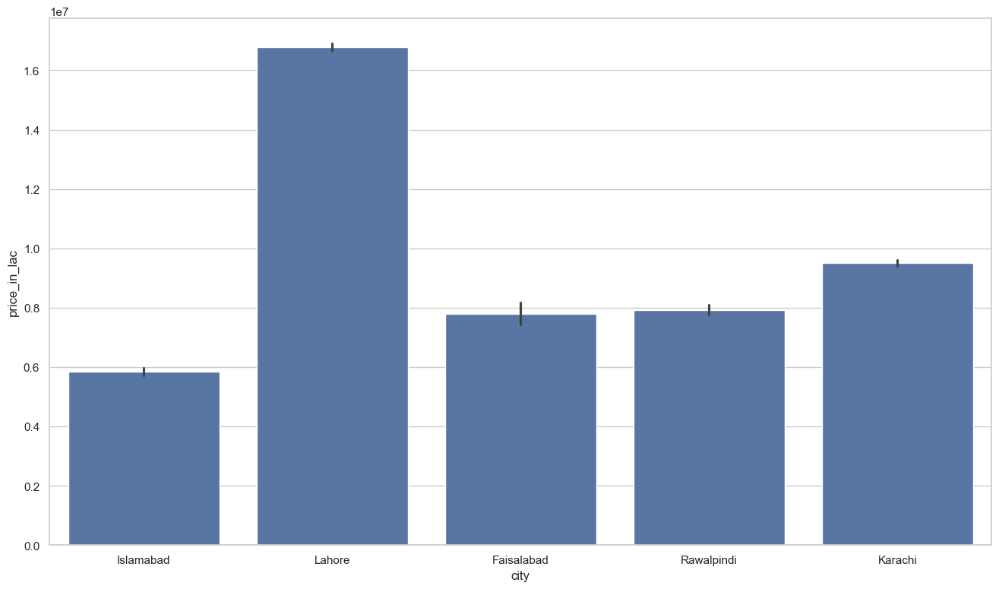

In [394]:
fig= plt.figure(figsize= (16,9))
sns.barplot(df, y="price_in_lac" , x = 'city' )

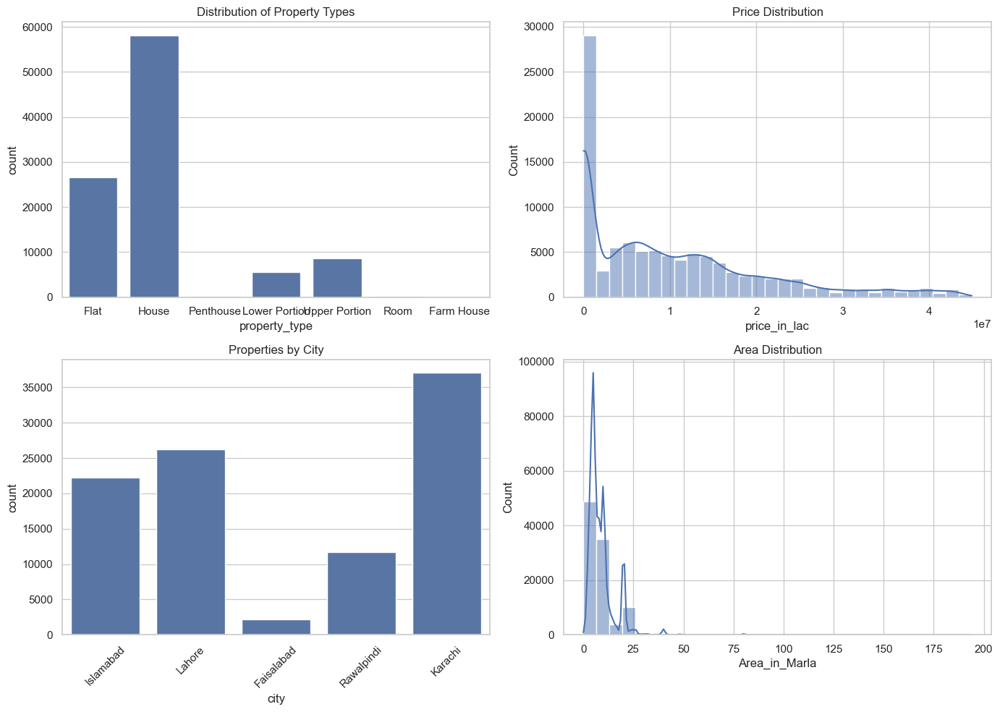

In [395]:
sns.set(style='whitegrid')

fig, axes = plt.subplots(2, 2, figsize=(14, 10), facecolor='white')

# Distribution of Property Types
sns.countplot(x='property_type', data=df, ax=axes[0, 0])
axes[0, 0].set_title('Distribution of Property Types')

# Price Distribution
sns.histplot(df['price_in_lac'], bins=30, ax=axes[0, 1], kde=True)
axes[0, 1].set_title('Price Distribution')

sns.countplot(x='city', data=df, ax=axes[1, 0])
axes[1, 0].set_title('Properties by City')
axes[1, 0].tick_params(axis='x', rotation=45)

sns.histplot(df['Area_in_Marla'], bins=30, ax=axes[1, 1], kde=True)
axes[1, 1].set_title('Area Distribution')

plt.tight_layout()
plt.show()

In [396]:
import plotly.express as px
from plotly.subplots import make_subplots

# Distribution of Property Types
fig_property_type = px.histogram(df, x='property_type', title='Distribution of Property Types')

# Price Distribution
fig_price = px.histogram(df, x='price_in_lac', title='Price Distribution', nbins=30)

# Properties by City
fig_city = px.histogram(df, x='city', title='Properties by City')

# Area Distribution
fig_area = px.histogram(df, x='Area_in_Marla', title='Area Distribution', nbins=30)

# Create subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=("Distribution of Property Types", "Price Distribution", "Properties by City", "Area Distribution"))

# Add each plot to the subplot
fig.add_trace(fig_property_type.data[0], row=1, col=1)
fig.add_trace(fig_price.data[0], row=1, col=2)
fig.add_trace(fig_city.data[0], row=2, col=1)
fig.add_trace(fig_area.data[0], row=2, col=2)

# Update layout
fig.update_layout(showlegend=False)

# Show the combined plot
fig.show()



In [397]:
city_median_prices = df.groupby('city')['price_in_lac'].median().sort_values(ascending=False)
city_median_prices


city
Lahore        14000000.0
Karachi        7000000.0
Faisalabad     6000000.0
Rawalpindi     4800000.0
Islamabad       130000.0
Name: price_in_lac, dtype: float64

In [398]:
# Filter data for Lahore
lahore_prices =df[df['city'] == 'Lahore']['price_in_lac']

# Histogram for property prices in Lahore
fig_lahore_prices = px.histogram(lahore_prices, title='Distribution of Property Prices in Lahore', labels={'value': 'Property Price'}, nbins=30)
fig_lahore_prices.show()

In [399]:
# Filter data for Lahore
import plotly.express as px
lahore_data = df[df['city'] == 'Lahore']

# Box plot for property prices in Lahore by property type
fig_lahore_type_prices = px.box(lahore_data, x='property_type', y='price_in_lac', title='Breakdown of Property Prices in Lahore by Property Type', labels={'price': 'Property Price', 'property_type': 'Property Type'})
fig_lahore_type_prices.show()

In [400]:
# Filter data for major cities in Pakistan
major_cities_data = df[df['city'].isin(['Lahore', 'Karachi', 'Islamabad', 'Rawalpindi', 'Faisalabad'])]

fig_major_cities_prices = px.box(major_cities_data, x='city', y='price_in_lac', title='Comparison of Property Prices in Major Cities of Pakistan', labels={'price': 'Property Price', 'city': 'City'})
fig_major_cities_prices.show()

In [401]:
df.head()

,Unnamed: 0,property_type,location,city,baths,purpose,bedrooms,Area_in_Marla,price_in_lac
0,0,Flat,G-10,Islamabad,2,For Sale,2,4.0,10000000
1,1,Flat,E-11,Islamabad,3,For Sale,3,5.6,6900000
2,2,House,G-15,Islamabad,6,For Sale,5,8.0,16500000
3,3,House,Bani Gala,Islamabad,4,For Sale,4,40.0,43500000
4,4,House,DHA Defence,Islamabad,3,For Sale,3,8.0,7000000


In [402]:
df['location']= df['location'].apply(lambda x : x.strip())
df.location.value_counts()

location
DHA Defence               11787
Bahria Town Karachi        6697
Bahria Town Rawalpindi     5257
Bahria Town                4437
Gulistan-e-Jauhar          3532
                          ...  
Times Residency               1
CBR Town Phase 2              1
Montgomery Road               1
Sahianwala                    1
Shahra-e-Liaquat              1
Name: count, Length: 1389, dtype: int64

In [403]:
location_counts = df.location.value_counts()

In [404]:
location_values_less20= location_counts[location_counts <=35]
location_values_less20

location
Formanites Housing Scheme    35
Hassan Town                  35
Peoples Colony No 2          35
Samundari Road               35
Hamza Town                   34
                             ..
Times Residency               1
CBR Town Phase 2              1
Montgomery Road               1
Sahianwala                    1
Shahra-e-Liaquat              1
Name: count, Length: 1145, dtype: int64

In [405]:
df['location']= df['location'].apply(lambda x :'other' if x in location_values_less20 else x)
df.location.value_counts()

location
DHA Defence               11787
other                      8362
Bahria Town Karachi        6697
Bahria Town Rawalpindi     5257
Bahria Town                4437
                          ...  
F-15                         36
KDA Scheme 1                 36
Dream Avenue Lahore          36
Millat Town                  36
Al Hafeez Gardens            36
Name: count, Length: 245, dtype: int64

In [406]:
df.shape

(99499, 9)

In [407]:


# Calculate the IQR
Q1 = df['price_in_lac'].quantile(0.25)
Q3 = df['price_in_lac'].quantile(0.75)
IQR = Q3 - Q1

# Determine the bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
df = df[(df['price_in_lac'] >= lower_bound) & (df['price_in_lac'] <= upper_bound)]



In [408]:
df.shape

(96905, 9)

In [409]:
df.head()

,Unnamed: 0,property_type,location,city,baths,purpose,bedrooms,Area_in_Marla,price_in_lac
0,0,Flat,G-10,Islamabad,2,For Sale,2,4.0,10000000
1,1,Flat,E-11,Islamabad,3,For Sale,3,5.6,6900000
2,2,House,G-15,Islamabad,6,For Sale,5,8.0,16500000
4,4,House,DHA Defence,Islamabad,3,For Sale,3,8.0,7000000
5,7,Flat,E-11,Islamabad,2,For Sale,2,6.2,7800000


In [410]:
df.head()

,Unnamed: 0,property_type,location,city,baths,purpose,bedrooms,Area_in_Marla,price_in_lac
0,0,Flat,G-10,Islamabad,2,For Sale,2,4.0,10000000
1,1,Flat,E-11,Islamabad,3,For Sale,3,5.6,6900000
2,2,House,G-15,Islamabad,6,For Sale,5,8.0,16500000
4,4,House,DHA Defence,Islamabad,3,For Sale,3,8.0,7000000
5,7,Flat,E-11,Islamabad,2,For Sale,2,6.2,7800000


In [411]:
df['property_type']=df['property_type'].str.replace('Room','House')

In [412]:
df.property_type.value_counts()

property_type
House            56118
Flat             26395
Upper Portion     8518
Lower Portion     5544
Penthouse          247
Farm House          83
Name: count, dtype: int64

In [413]:


# Calculate the IQR
Q1 = df['Area_in_Marla'].quantile(0.25)
Q3 = df['Area_in_Marla'].quantile(0.75)
IQR = Q3 - Q1

# Determine the bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
df = df[(df['Area_in_Marla'] > lower_bound) & (df['Area_in_Marla'] <upper_bound)]

In [414]:
df.shape

(86398, 9)

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'baths'}>],
       [<Axes: title={'center': 'bedrooms'}>,
        <Axes: title={'center': 'Area_in_Marla'}>],
       [<Axes: title={'center': 'price_in_lac'}>, <Axes: >]], dtype=object)

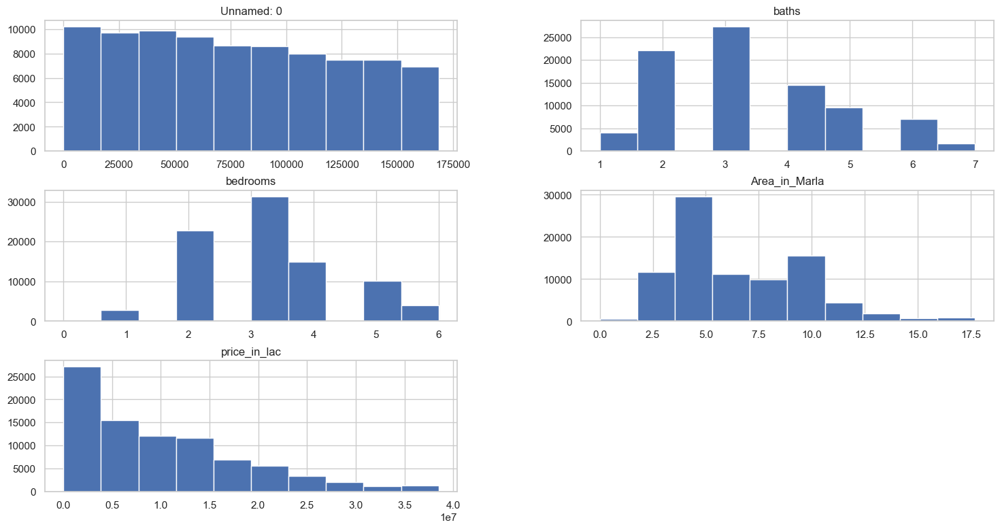

In [415]:
df.hist(figsize=(18,9))

In [ ]:
# df['price']= df['price']/100000

c:\Users\BS\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\categorical.py:632: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



<Axes: xlabel='price_in_lac'>

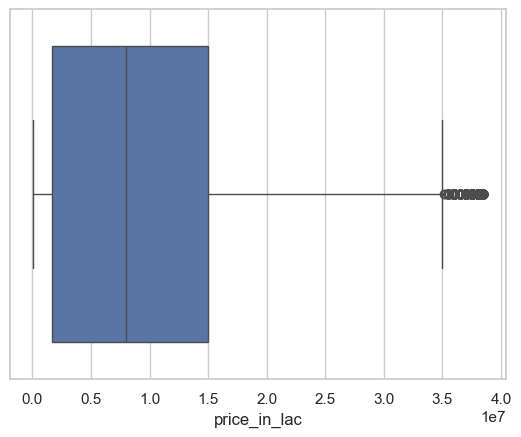

In [416]:
#boxplot of price 
sns.boxplot(x=df['price_in_lac'])

<Axes: xlabel='price_in_lac', ylabel='Density'>

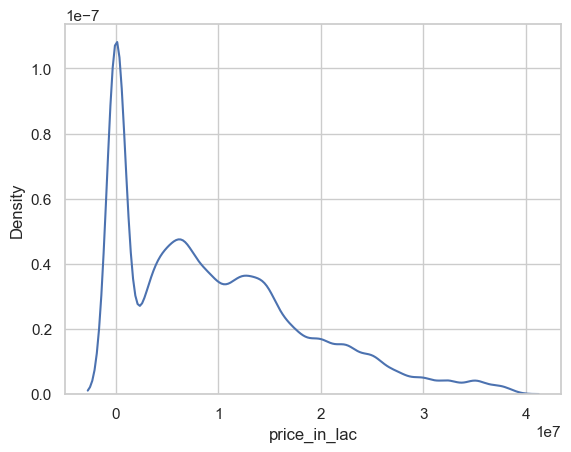

In [417]:
sns.kdeplot(df['price_in_lac'],)

In [418]:
df['price_in_lac'] = np.log1p(df['price_in_lac'])

In [419]:
import streamlit as st
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score,adjusted_rand_score
from sklearn.metrics import  accuracy_score
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
# Load dataset
# islamabad_data = pd.read_csv('path_to_your_dataset.csv')

# Assuming the dataset is already loaded into islamabad_data
# One-hot encode categorical variables
# df['price_log'] = np.log1p(df['price'])

categorical_features = ['property_type', 'purpose', 'location','city']
numerical_features = ['bedrooms', 'Area_in_Marla', 'baths']

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(sparse_output=False), categorical_features)
    ],
    remainder='passthrough'
)

# Preparing the data
X = df.drop(['Unnamed: 0','price_in_lac'], axis=1)
y = df['price_in_lac']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and training the pipeline
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor())
])

model.fit(X_train, y_train)
y_pred = model.predict(X_test)


# Calculating metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
# accuracy = accuracy_score(y_test, y_pred)

print(f"Mean Absolute Error: {mae}")
print(f"R2 Score: {r2}")
# print (f"accuracy_score {accuracy}")



Mean Absolute Error: 0.19757740476803662
R2 Score: 0.9852791071502947


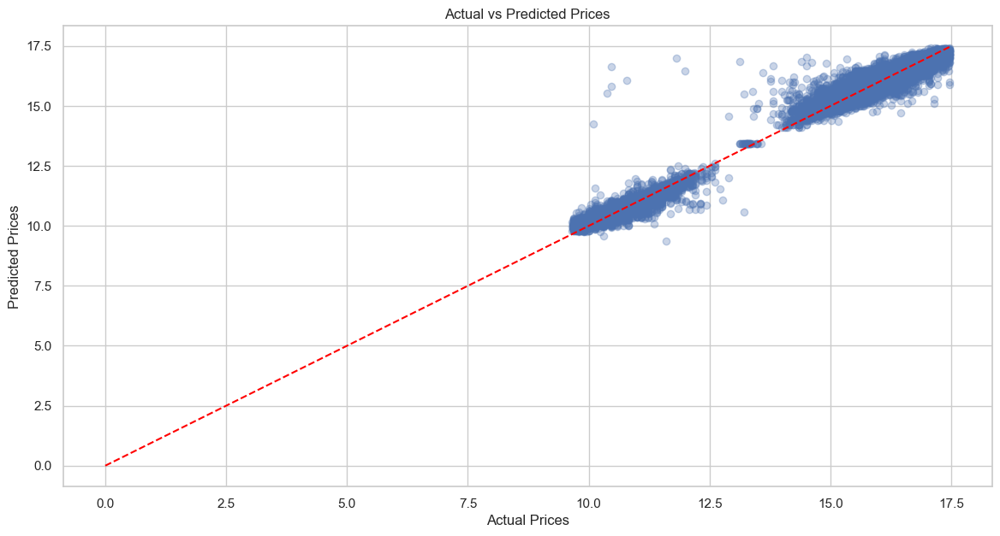

In [420]:
import matplotlib.pyplot as plt

# Scatter plot of predicted vs actual prices
plt.figure(figsize=(14, 7))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot([0, max(y_test)], [0, max(y_test)], color='red', linestyle='--')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices')
plt.show()


In [ ]:
df1= pd.DataFrame({'actual':np.expm1(y_test),'Predicted':np.expm1(y_pred)})
df1.sample(10)

In [ ]:
model2 = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(random_state=42))
])

In [ ]:
model2.fit(X_train,y_train)

In [ ]:
y_pred_ref = model2.predict(X_test)


In [ ]:
import matplotlib.pyplot as plt

# Scatter plot of predicted vs actual prices
plt.figure(figsize=(16, 9))
plt.scatter(y_test, y_pred_ref, alpha=0.3)
plt.plot([0, max(y_test)], [0, max(y_test)], color='red', linestyle='--')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices')
plt.show()


In [ ]:
df2= pd.DataFrame({'actual':np.expm1(y_test),'Predicted':np.expm1(y_pred_ref)})
df2.sample(10)